In [11]:
import numpy as np
import math
import random
import timeit
import seaborn as sns
import matplotlib.pyplot as plt

1. **Trivial matrix multiplication**

In [16]:
def trivial_multiplication(matrix_1: list, matrix_2: list):
    if len(matrix_1[0]) != len(matrix_2):
        return "matrix_1 column != matrix_2 row"
    result = [[0 for i in range(len(matrix_2[0]))] for i in range(len(matrix_1))]
    for i in range(len(matrix_1)):
        for j in range(len(matrix_2[0])):
            for k in range(len(matrix_2)):
                result[i][j] += matrix_1[i][k] * matrix_2[k][j]
    return result

2. **Matrix multiplication with Strassen`s algorithm**

In [17]:
def split(matrix):
    row2, col2 = matrix.shape[0] // 2, matrix.shape[1] // 2
    return matrix[:row2, :col2], matrix[:row2, col2:], matrix[row2:, :col2], matrix[row2:, col2:]

def reshape_array(x, amount):
    if x.shape[0] != amount or x.shape[1] != amount:
        new_x = np.ones((amount, amount))
        for i in range(amount):
            if i < x.shape[0]:
                value = amount - x.shape[1]
                new_x[i] = np.concatenate([x[i], np.zeros(value)])
            else:
                new_x[i] = np.zeros(amount)

        x = new_x
    return x
    


def strassen(x, y):
    if x.shape[1] != y.shape[0]:
        return "It`s impossible to calculate"
    if len(x) == 1:
        return x * y

    n = max(x.shape[0], x.shape[1], y.shape[1], y.shape[0])
    base = math.ceil((math.log(n, 2)))
    amount = 2 ** base
    
    if x.shape[0] != amount and x.shape[1] != amount:
        x = reshape_array(x, amount)
    if y.shape[0] != amount and y.shape[1] != amount:
        y = reshape_array(y, amount)
    
    a, b, c, d = split(x)
    e, f, g, h = split(y)
    
    p1 = strassen(a, f - h)  
    p2 = strassen(a + b, h)        
    p3 = strassen(c + d, e)        
    p4 = strassen(d, g - e)        
    p5 = strassen(a + d, e + h)        
    p6 = strassen(b - d, g + h)  
    p7 = strassen(a - c, e + f)
    
    # Computing the values of the 4 quadrants of the final matrix c
    c11 = p5 + p4 - p2 + p6  
    c12 = p1 + p2           
    c21 = p3 + p4            
    c22 = p1 + p5 - p3 - p7 
    c = np.vstack((np.hstack((c11, c12)), np.hstack((c21, c22)))) 
    return c

3. **Derive time complexities**

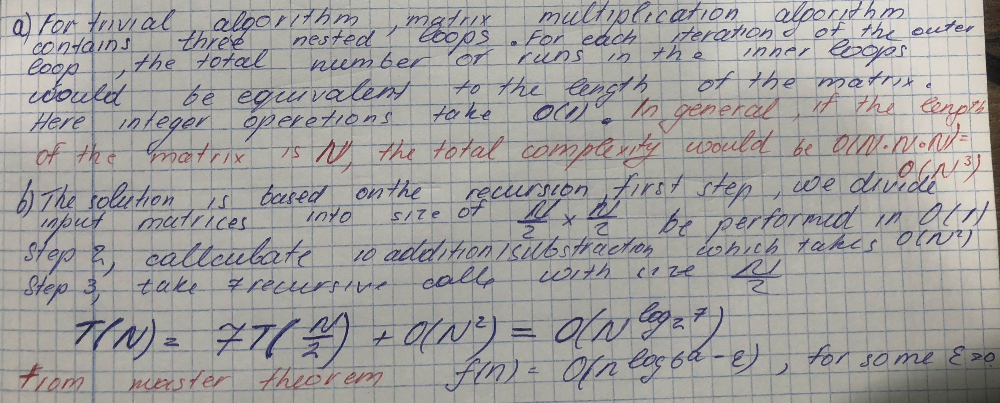

**Actual execution times in experiments**

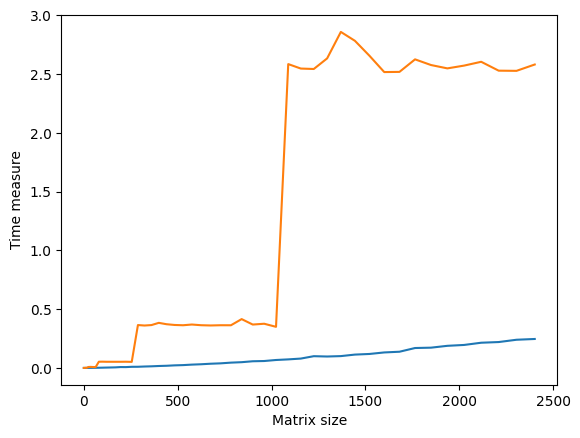

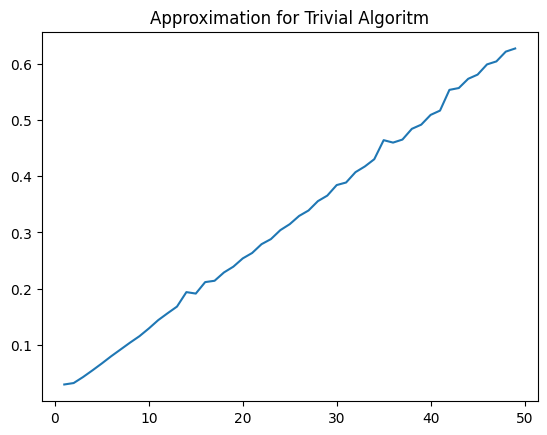

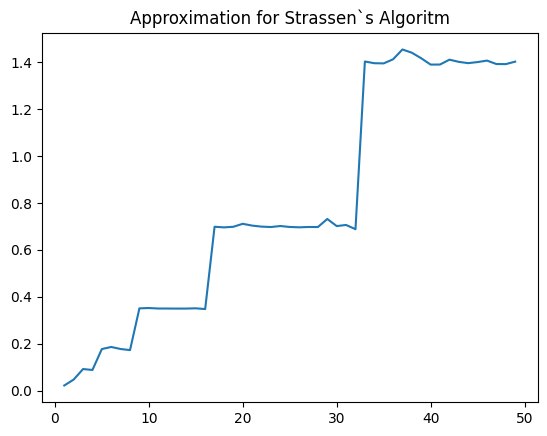

In [18]:
def trivial_alg(elements):
    result = []
    for i in elements:
        time = timeit.timeit(lambda: trivial_multiplication(i, i), number=5)
        result.append(time)
    return result


def strassen_alg(elements):
    result = []
    for i in elements:
        time = timeit.timeit(lambda: strassen(i, i), number=5)
        result.append(time)
    return result

def generate_grid():
    el = []
    for i in range(1, 50):
        lst = np.random.randint(1000, size=(i, i))
        el.append(lst)
    return el
            
            

element = generate_grid()
trivial_t = trivial_alg(element)
strassen_t = strassen_alg(element)
plt.plot([len(x[0])**2 for x in element], trivial_t)
plt.plot([len(x[0])**2 for x in element], strassen_t)
plt.ylabel('Time measure')
plt.xlabel('Matrix size')
plt.show()
trivial_aprox = [i**(1/3) for i in trivial_t]
plt.plot(list(range(1, 50)), trivial_aprox)
plt.title('Approximation for Trivial Algoritm')
plt.show()
strassen_aprox = [i**(math.log(2,7)) for i in strassen_t]
plt.plot(list(range(1, 50)), strassen_aprox)
plt.title('Approximation for Strassen`s Algoritm')
plt.show()
